* Nama : Muhammad Mahdi
* Nim  : 21/473808/PA/20431

# No 1
Membuat dan Menyajikan Histogram dari gambar

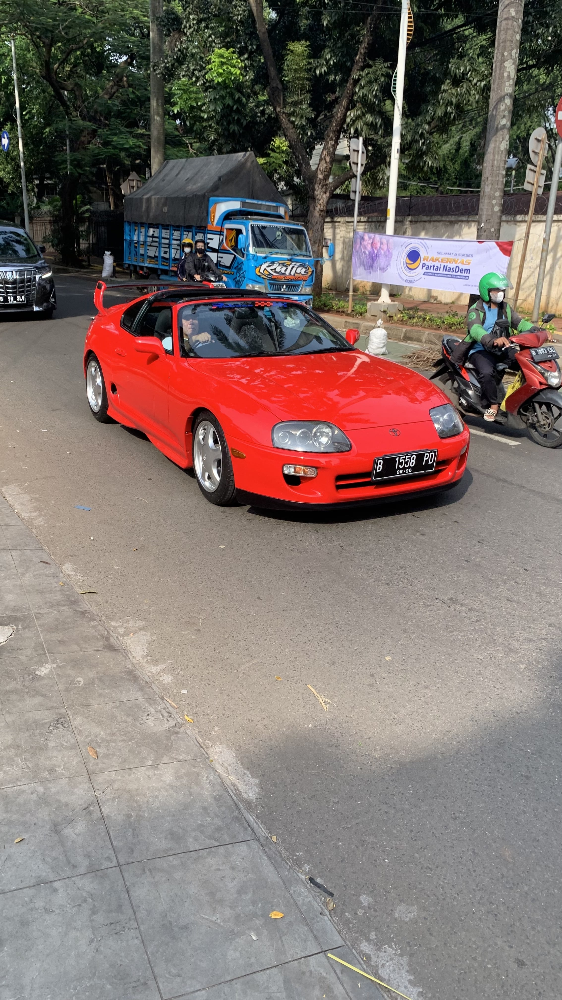

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow

#Membaca image dari google drive
gambar = cv.imread('/content/drive/MyDrive/Colab Notebooks/supra-min.jpg')

#Menampilkan gambar
cv2_imshow(gambar)

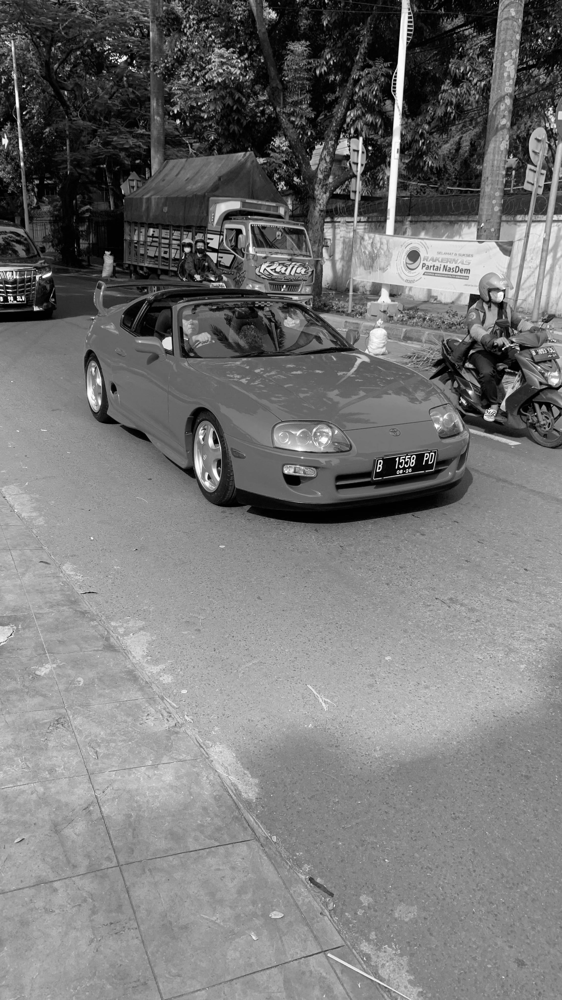

array([[ 90, 107, 114, ...,  34,  34,  36],
       [ 85, 104, 114, ...,  48,  47,  48],
       [ 72,  84,  89, ...,  56,  55,  54],
       ...,
       [157, 155, 153, ..., 135, 134, 133],
       [159, 158, 157, ..., 136, 132, 129],
       [159, 160, 160, ..., 136, 131, 127]], dtype=uint8)

In [ ]:
#Mengkonversi warna dari RGB menjadi Grayscale
gambar_abu = cv.cvtColor(gambar, cv.COLOR_BGR2GRAY)

#Memunculkan gambar grayscale dan hasil sampling
cv2_imshow(gambar_abu)
display(gambar_abu)

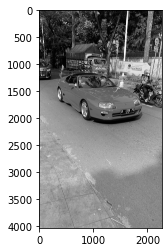

In [ ]:
import matplotlib.pyplot as plt

#Menampilkan gambar dengan librarty matplotlib supaya dapatb mengetahui ukuran gambar
plt.imshow(gambar_abu, cmap=plt.get_cmap('gray'))
plt.show()

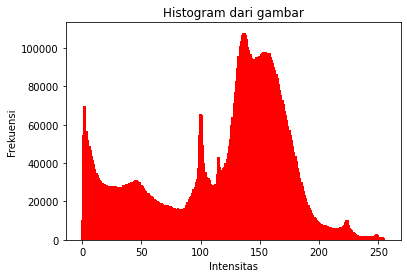

In [ ]:
import numpy as np

#Melakukan for loop untuk mencari banyaknya kemunculan suatu intensitas pada gambar
height = [0]*256
for x in range(gambar_abu.shape[0]):
    for y in range(gambar_abu.shape[1]):
        i = gambar_abu[x,y]
        height[i] = height[i]+1
Intensity= np.arange(0, 256, 1)

#Mengatur histogram, mulai dari warna hingga judul
plt.bar(Intensity,height,color="red",width=2)
plt.xlabel("Intensitas")
plt.ylabel("Frekuensi")
plt.title("Histogram dari gambar")
plt.show()

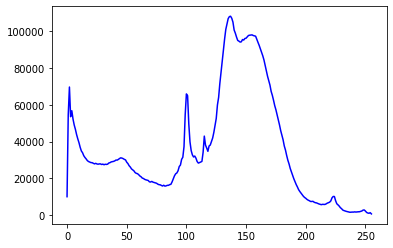

In [ ]:
image = gambar_abu.copy();
hist = cv.calcHist([image], [0], None, [256], [0, 256])
plt.plot(hist, color='b')

# Kesimpulan
Dari histogram diatas dapat kita lihat bahwa gambar tersebut memiliki warna yg bermacam macam, namun masih terdominasi oleh warna yang cenderung terang. Hal tersebut dapat dibuktikan dengan banyaknya frekuensi yang muncul diantara intensitas 100 - 200

# No 2
Mengquantisasi gambar dengan metode Non-Uniform Quantization

In [ ]:
import pandas as pd

histodf = pd.DataFrame({
    "max_intesity": range(256),
    "pixel_sum": height
})

first_level = 4
threshold = 1000000

In [ ]:
Interval_baru = []

#Fungsi untuk membuat interval
def make_interval(intervals):
  for interval in intervals:
    if(histodf.pixel_sum[interval[0]: interval[1]].std() > threshold):
      final_intervals = []
      final_mean = count_mean(interval)
      final_intervals.append([interval[0], final_mean])
      final_intervals.append([final_mean, interval[1]])
      make_interval(final_intervals)
    else:
      Interval_baru.append(interval)
  return

#Mencari mean suatu warna dakam interval
def count_mean(interval):
  weighted_sum = sum(i * histodf.pixel_sum[i]
      for i in range(interval[0], interval[1]))
  total_pixel = histodf.pixel_sum[interval[0]:interval[1]].sum()
  final_mean = weighted_sum // total_pixel
  return final_mean

#Quantisasi dengan penerapan algoritma Max-Lloyd
Interval = [[i*256//first_level, (i+1)*256//first_level-1]
    for i in range (first_level)]
make_interval(Interval)

In [ ]:
#Memasukan gambar kedalam quantisasi
def final_image(intervals):
  gambar_akhir = gambar_abu.copy()
  for i in range(len(gambar_abu)):
    for j in range(len(gambar_abu[0])):
      for k in range(len(intervals)):
        min, max = intervals[k]
        if gambar_akhir[i, j] > min and gambar_akhir[i,j] < max:
          gambar_akhir[i, j] = max
  return gambar_akhir

#Mencetak interval gambar setelah diquantisasi
print("Interval \tPanjang")
for x in range(len(Interval_baru)):
  print(Interval_baru[x], "\t  ", (Interval_baru[x][1] - Interval_baru[x][0]))

Interval 	Panjang
[0, 63] 	   63
[64, 127] 	   63
[128, 191] 	   63
[192, 255] 	   63


Text(0.5, 1.0, 'Gambar grayscale dengan quantisasi')

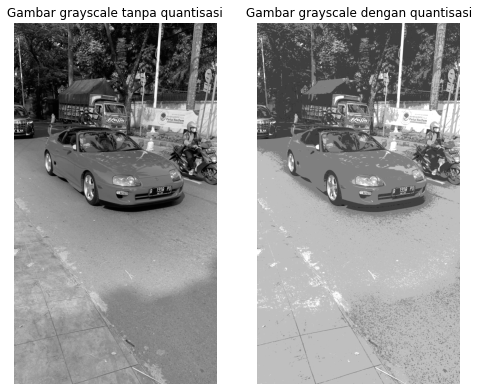

In [ ]:
gambar_akhir = final_image(Interval_baru)

fig = plt.figure(figsize=(8, 20))
rows = 2
columns = 2

fig.add_subplot(rows, columns, 1)

#Menunjukan image asli(tanpa quantisasi)
plt.imshow(gambar_abu,cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.title("Gambar grayscale tanpa quantisasi")


fig.add_subplot(rows, columns, 2)

#Menunjukan image(hasil quantisasi)
plt.imshow(gambar_akhir, cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.title("Gambar grayscale dengan quantisasi")


# Kesimpulan
Dari percobaan diatas dapat disimpulkan bahwa dengan mengquantisasi metode non-uniform quantization dapat membuat kontras putih menjadi lebih jelas. Dan dengan metode ini warna dari gambar dapat terlihat lebih akurat dalam mempresentasikan datanya.

Kontras putih tersebut dapat kita lihat dari bagian jalan yg semakin cerah dibandingkan bagian lainnya.